In [1]:
import tensorflow as tf, numpy as np, matplotlib.pyplot as plt, matplotlib.cm as cm
from matplotlib import animation, rc
from IPython.display import HTML, display
%matplotlib inline

/home/silviu/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
from basic_mnist_manifold_generator import Model, MnistManifoldGenerator

Extracting MNIST_data/train-images-idx3-ubyte.gz
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


In [3]:
g = Model()
g.load()
g.eval_autoencoder()

INFO:tensorflow:Restoring parameters from ./saves/basic


0.008724753

In [4]:
gen = MnistManifoldGenerator(g)
man = gen()
print("manifold shape: {}".format(man.shape))

manifold shape: (3000, 784)


In [5]:
from manifold_visualizer import plot_mxn, draw_mxn_mnist_manifolds, animate_mnist_manifold

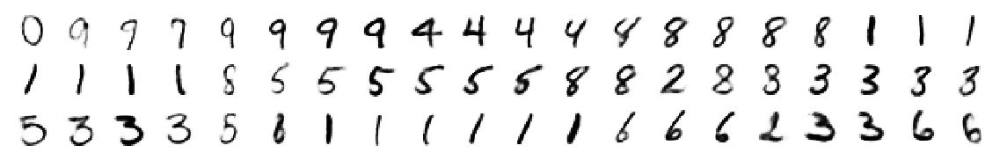

In [6]:
draw_mxn_mnist_manifolds(gen, 3, 20, 0.2)

In [7]:
%%capture
gen = MnistManifoldGenerator(g)
man = gen()
anim = animate_mnist_manifold(man)

In [13]:
# This can be slow!
HTML(anim.to_html5_video())

In [8]:
res = g.sess.run(g.preds, {g.x: man})

In [9]:
def plot_projections(projections):
  fig, axes = plt.subplots(10, 1)

  fig.set_figheight(10)
  fig.set_figwidth(12)
  
  for i, ax in enumerate(axes):
    ax.set_axis_off()
    ax.legend([],[],title=str(i), loc="upper left", frameon=False, bbox_to_anchor=(-0.05, 1.))
    ax.set_xlim([0, len(projections)])
    ax.set_ylim([0., 1.])
    ax.plot(range(len(res)), projections[:,i], linewidth=1, color='black')

  return fig

In [10]:
%%capture
f = plot_projections(res)

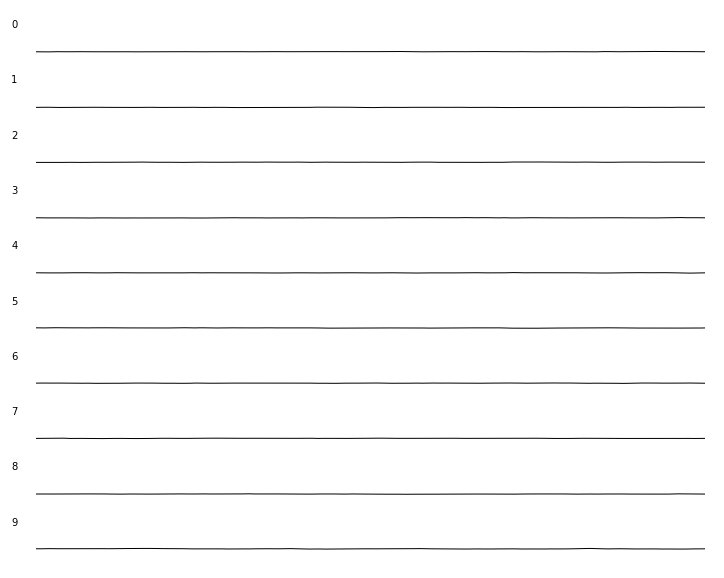

In [11]:
display(f)

In [12]:
def generate_frames(num_batches=1000, batch_size=50):
  g = Model()
  g.load()
  manifold = MnistManifoldGenerator(g)()
  
  res = []
  for i in range(num_batches):
    g.classifier_trainstep(batch_size)
    projections = g.sess.run(g.preds, {g.x: manifold})
    
    res.append(projections)
    
  return res    

In [13]:
def animate_training(frames):
  
  fig, axes = plt.subplots(10, 1)

  fig.set_figheight(10)
  fig.set_figwidth(12)
  fig.counter = 0
  
  for i, ax in enumerate(axes):
    ax.set_axis_off()
    ax.legend([],[],title=str(i), loc="upper left", frameon=False, bbox_to_anchor=(-0.05, 1.))
    ax.set_xlim([0, len(frames[0])])
    ax.set_ylim([0., 1.])
    line, = ax.plot(range(len(frames[0])), linewidth=1, color='black')
    
  
  def animate(j):
    projections = frames[fig.counter]
    fig.counter = min(len(frames)-1, fig.counter+1)
    
    for i, ax in enumerate(axes):
      if ax.lines:
        ax.lines[0].set_ydata(projections[:,i])
    return (fig,)

  # call the animator. blit=True means only re-draw the parts that have changed.
  anim = animation.FuncAnimation(fig, animate, init_func=lambda: animate(0),
                                 frames=len(frames), interval=200, blit=True)
  
  return anim


In [14]:
%%capture
frames = generate_frames()

INFO:tensorflow:Restoring parameters from ./saves/basic


In [15]:
%%capture
a = animate_training(frames)

In [17]:
# This can be slow!
HTML(a.to_html5_video())

In [402]:
HTML(a.to_html5_video())